<a href="https://colab.research.google.com/github/yzhang486/Neural_Signals_and_Computation_yzhan486_GitHUB/blob/main/yzhan486_main_ex_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mount google drive and GITHUB


In [1]:
### This cell mounts google drive to access TIF images
from google.colab import drive
drive.mount('/content/drive')
import os
### "My Drive" by default, otherwise please change the directory to the one that contains TIF images
os.chdir("/content/drive/My Drive")


Mounted at /content/drive


In [7]:
### Clone GITHUB of yzhan486 to access the code
!git clone https://github.com/yzhang486/Neural_Signals_and_Computation_yzhan486_GitHUB.git
os.chdir('Neural_Signals_and_Computation_yzhan486_GitHUB')

Cloning into 'Neural_Signals_and_Computation_yzhan486_GitHUB'...
remote: Enumerating objects: 163, done.
remote: Counting objects: 100% (98/98), done.
remote: Compressing objects: 100% (98/98), done.
remote: Total 163 (delta 54), reused 0 (delta 0), pack-reused 65
Receiving objects: 100% (163/163), 1.46 MiB | 7.27 MiB/s, done.
Resolving deltas: 100% (88/88), done.


#PROBLEM 1

In [7]:
## Load functions for PROBLEM 1
%run yzhan486_problem_1_ex_1.py

<Figure size 640x480 with 0 Axes>

In [4]:
## Problem 1 Part A
# Execute this cell to visualize video and output variable "frames" for Part B
if __name__ == "__main__":
    tif_path = "/content/drive/MyDrive/TEST_MOVIE_00001-small-motion.tif" # This is a default path for accessing the TIF images in My Drive.
    frames_small_motion = read_tif_frames(tif_path) # The variable frames will be used again in part B
    plot_video(frames_small_motion[1:11]) ## Reminder: plotting all 500 slices has been observed to lead to colab crash, please try 10-20 slices at one time e.g. plot_video(frames[10:20]) for a quick visualization without crash.
    print("Video plotting complete.") # Press the "Play" and "Pause" button on the left upper corner for visualization

Video plotting complete.


In [6]:
## Problem 1 Part B
# Initialization
frame1 = frames_small_motion[200]  # First frame data here, can be randomly changed to any positive integer smaller than 500
frame2 = frames_small_motion[480]  # Second frame data here, can be randomly changed to any positive integer smaller than 500
max_shift = 25  # Maximum shift half of dimension, note: if runs a bit slow on colab, the user can decrease the number to 50

# Compute correlation map between the two frames
correlation_map = compute_shifted_correlation(frame1, frame2, max_shift)

# To find the shift with the correlation peak
max_correlation_value = np.max(correlation_map)
peak_idx = np.unravel_index(np.argmax(correlation_map), correlation_map.shape)
print(f"Maximum correlation value: {max_correlation_value}")
print(f"Location of the correlation peak (shift_y, shift_x): {peak_idx[0]-max_shift-1,peak_idx[1]-max_shift-1}") #The output tells you where correlation peak occurs

Maximum correlation value: 27845075732.0
Location of the correlation peak (shift_y, shift_x): (-1, 2)


The correlation peak occurs with the shifts printed above. By shifting the frame along x and y axes with the amount printed, the correlation value reaches the maximum.


### PROBLEM 2


In [5]:
## Load functions for PROBLEM 2
%run yzhan486_problem_2_ex_1.py

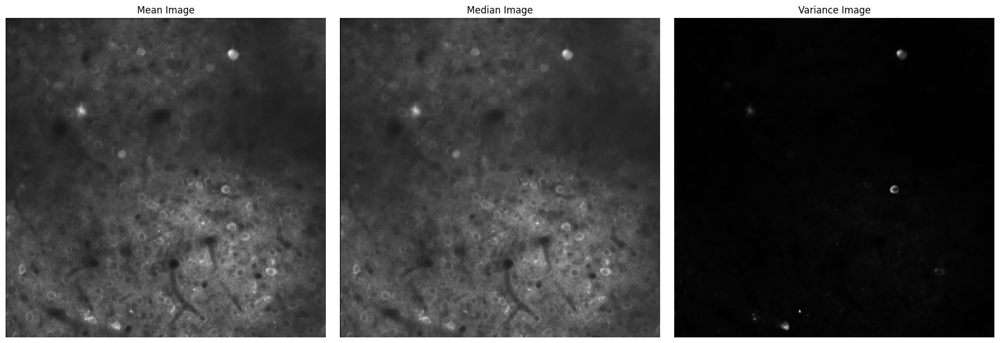

In [8]:
## Problem 1 Part A
# Execute this cell calculating, saving and plotting summary images
if __name__ == "__main__":
    tif_path = "/content/drive/MyDrive/TEST_MOVIE_00001-small.tif" # This is a default path for accessing the TIF images in My Drive.
    frames_small = read_tif_frames(tif_path) # The variable frames will be used again in part B
    mean_img, median_img, variance_img = calculate_summary_images(frames_small) # The image variables will be used in problem 3 for analyses
    plot_summary_images(mean_img, median_img, variance_img)

I realized that both the median and mean images contain far more noise of the background than the variance image. Mean and median images are very alike each other. Variance image tells us the variation of pixel intensity of each point across the image stack, so higher enhanced regions represent those cell dynamic regions. The variance image will be better for identifying ROIs.

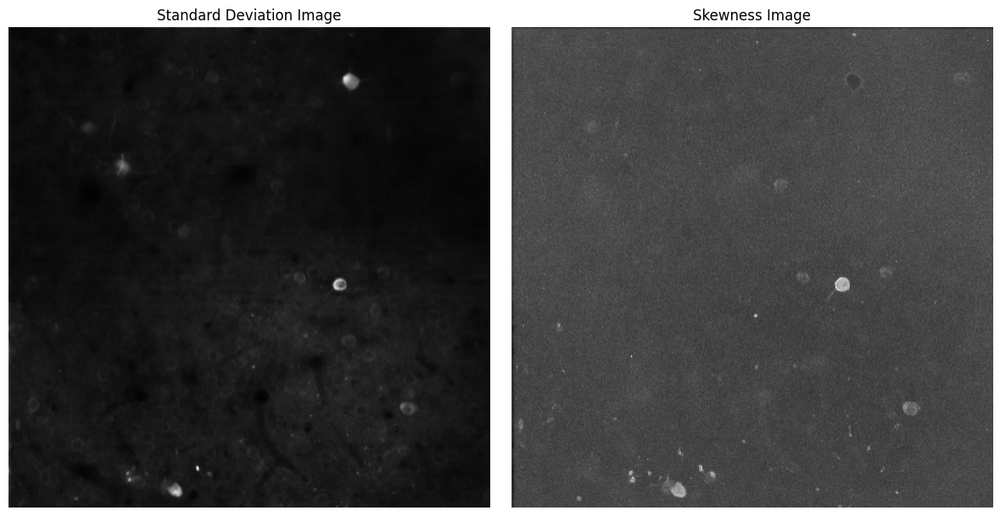

In [9]:
## Problem 2 Part B
std_img, skew_img = std_skew_images(frames_small)

I think a good summary image would emphasize on the highlighted cell dynamics without containing too much background noise. I picked standard deviation and skewness as my testing statistics. Both of them perform better than the mean and median images in eliminating background noises, but did not excel the variance image.

### PROBLEM 3


In [6]:
## Problem 3
# This code can only be executed after problem 2 has been run, as it assumes the variance image has been generated already.
%run yzhan486_problem_3_ex_1.py

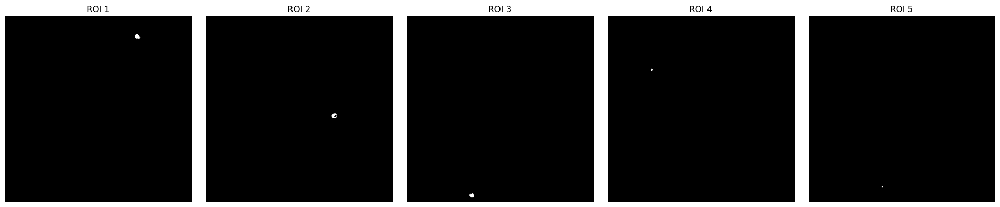

In [14]:
## Identify ROIs from the variance image
roi_masks = plot_roi(variance_img) #The variable roi_masks will continue to be used in problem 4

Part B: there are multiple ways to assess how well the script perform
1. Qualitative assessment: this needs expert validation (e.g. checked by a biologist)
2. Quantitative assessment:
If there is ground-truth data (manually annotated data), parameters such as accuracy (percent of correctly identified pixels), dice coefficient can be calculated to assess the performance. If there is no ground-truth data, consistency across the time-series can be useful.


### PROBLEM 4

In [8]:
## Problem 4: Time trace estimation
# This code can only be executed after problem 2 has been run, as it assumes the variance image has been generated already.
%run yzhan486_problem_4_ex_1.py

<Figure size 640x480 with 0 Axes>

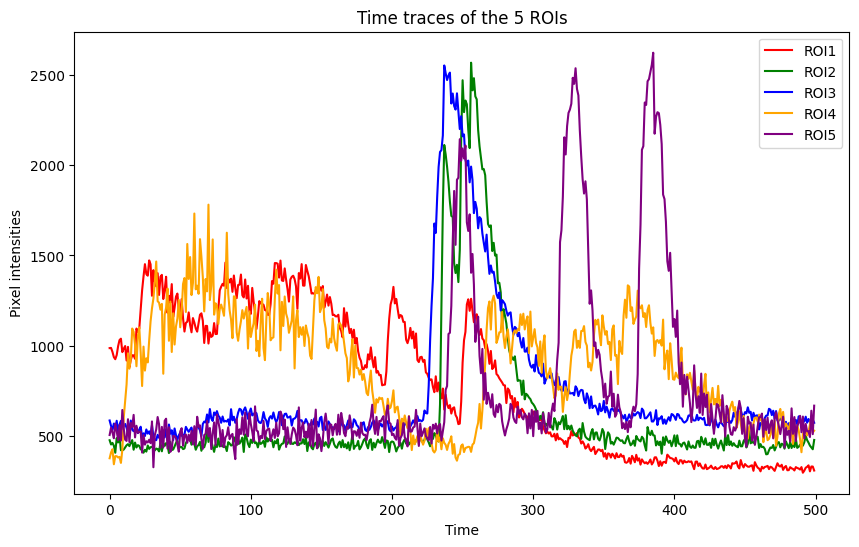

In [16]:
## Part A: Plot time traces
time_traces = extract_time_traces(frames_small, roi_masks)
plot_time_traces(time_traces)

Describe the approach: I applied the 5 binary ROI masks on each frame of the image sequence. The pixel intensities beside the target region will be zeroed out. I then calculated the mean value of the segmented region's pixel intensity for each frame and plot the pixel intensity value regarding time.

Part B: From visual examination,most of the time traces match with the actual activity in the video. For example, ROI 2 has high pixel intensity values around frame 230-280. From the video, it is obvious that the ROI 2 was highlighted during this time period. ROI 5 has a peak at frame 400, which is also observable in the video.

To test the accuracy, methods like counting the peak location (compare to frame number), peak height (compare to intensity of pixels) and number of peak (compare to highlight occurrence) can be applied.

# PROBLEM 5

In [3]:
## Problem 5
# This code can only be executed after problem 2 has been run, as it assumes the variance image has been generated already.
%run yzhan486_problem_5_ex_1.py

# Ensure correct directory and load TIF image
os.chdir("/content/drive/My Drive")

file_path = "TEST_MOVIE_00001-small.tif"
frames,pixel_matrix, height, width = load_and_vectorize_tiff(file_path)

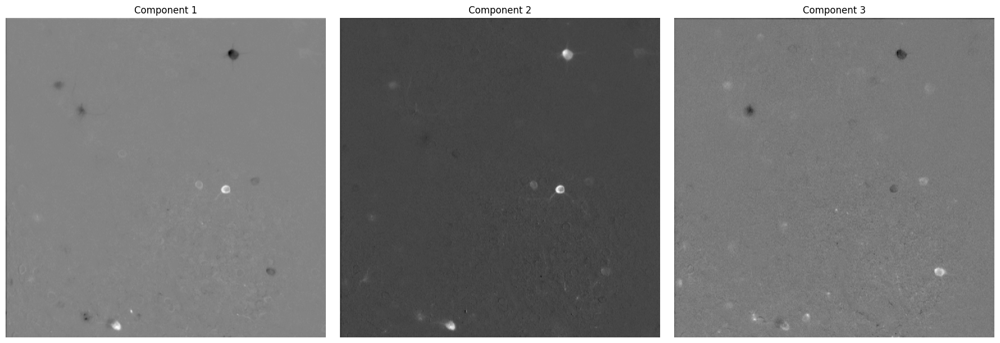

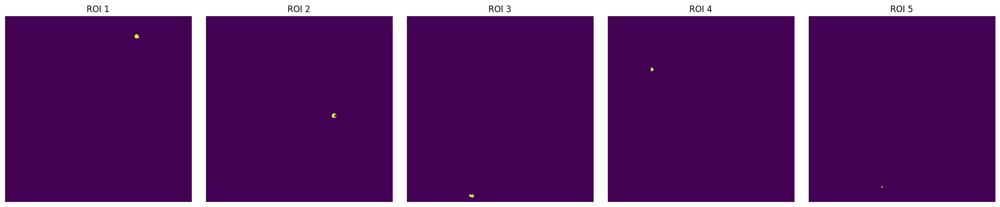

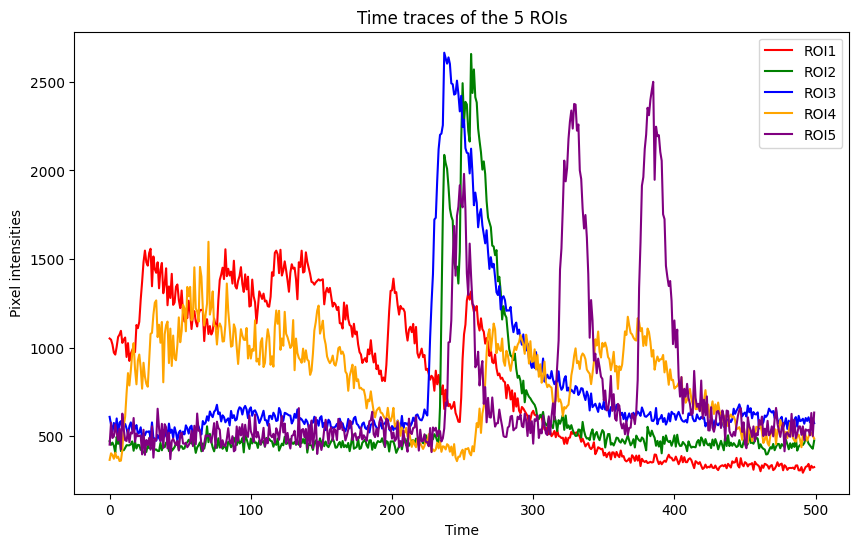

In [68]:
## Part A, using PCA to identify ROIs

# Apply PCA
# To determine whether the number of components of PCA plays a role, I tried 5, 10, 15 components
target_components_pca = 5
components_pca = perform_pca(pixel_matrix,target_components_pca)

## Plot the most significant components
plot_component_images(components_pca)

# Get ROI masks from all the PCA components
var_pca_img = np.var(components_pca,axis=0)
# Plot the segmented ROI masks
roi_masks_pca = plot_roi(var_pca_img.reshape(height, width))

## Call previous time trace functions
time_traces_pca = extract_time_traces(frames, roi_masks_pca)
plot_time_traces(time_traces_pca)

Part A: Using PCA, the top 3 components did not vary when changing the number of components. The final result (ROI masks and time traces) did change when adjusting the number of PCA components. For example, I realized that ROI 5 was not successfully identified when there are  5 or 20 components, but got identified when there are 10 and 15 components.

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


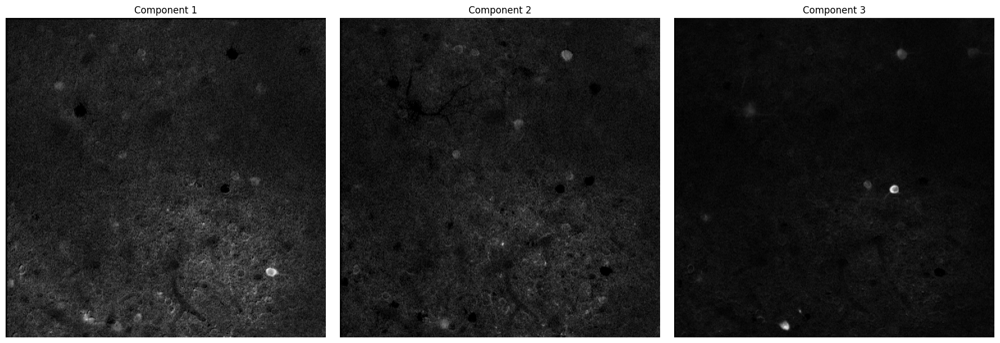

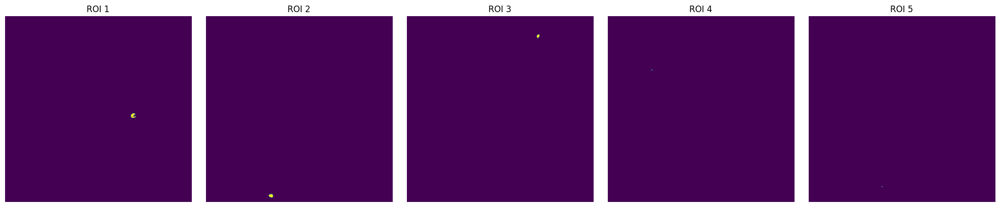

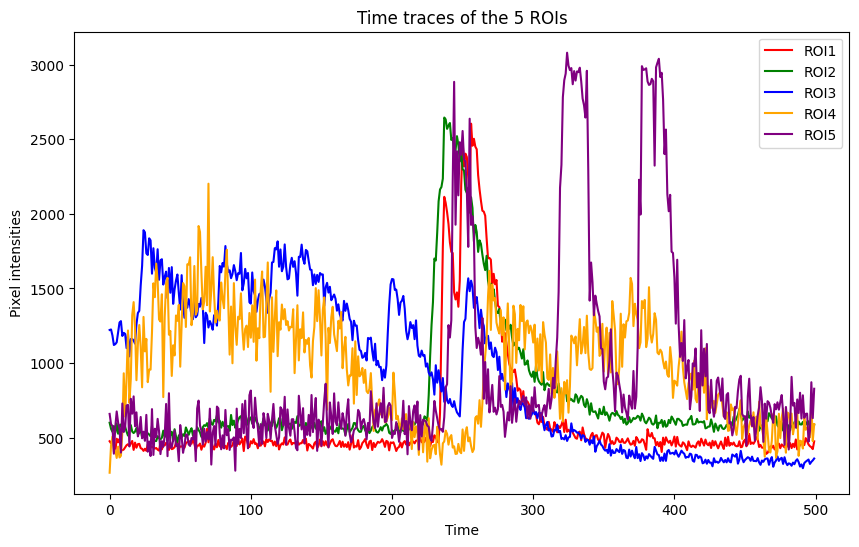

In [15]:
## PART B, using NMF to identify ROIs
target_components_nmf = 5
_,components_nmf,_ = perform_nmf(pixel_matrix,target_components_nmf)
#component_image_nmf = components_nmf[0].reshape(height, width)
# Plot most significant image
plot_component_images(components_nmf,height,width)

# Get ROI masks from the most significant component
var_nmf_img = np.var(components_nmf,axis=0)
roi_masks_nmf = plot_roi(var_nmf_img.reshape(height, width))


## Call previous time trace functions
time_traces_nmf = extract_time_traces(frames, roi_masks_nmf)
plot_time_traces(time_traces_nmf)

PART B: Compared to PCA, NMF did not perform as well to eliminate background noise, as shown in the component images. ROI results do not vary a lot when changing the number of target components, but ROI 5's trace is still found to vary with the number of components.

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


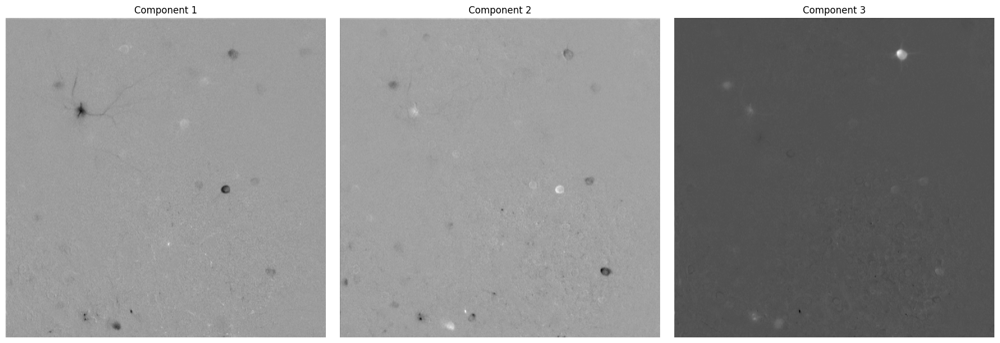

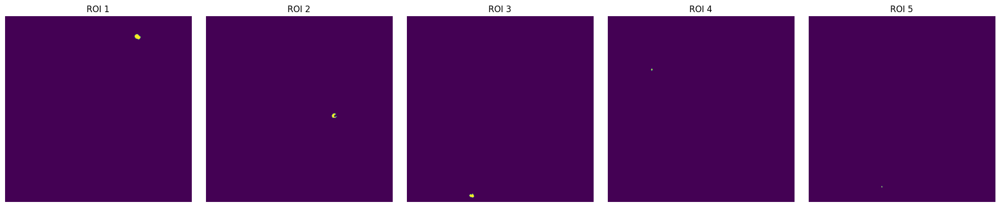

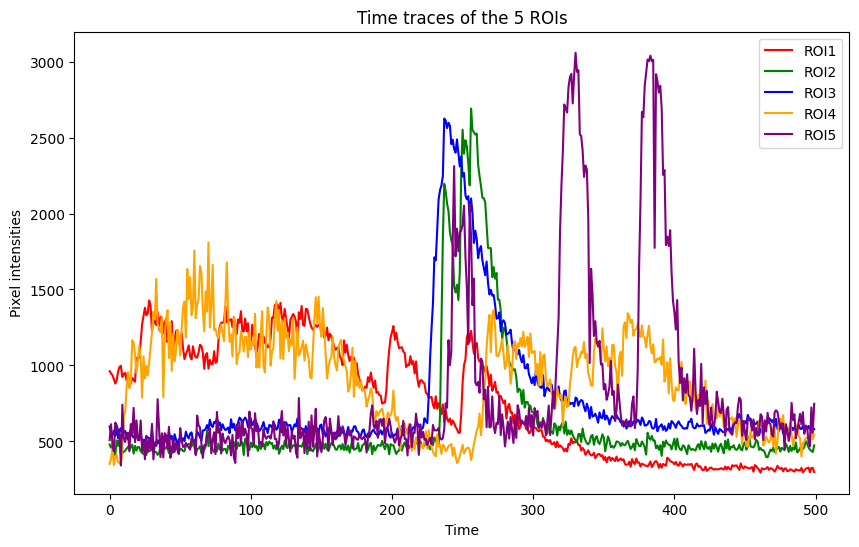

In [16]:
## Part C, using ICA to identify ROIs
target_components_ica = 5
_,components_ica,_ = perform_ica(pixel_matrix,target_components_ica)
#component_image_ica = components_ica.T[0].reshape(height, width)
# Plot top 3 components
plot_component_images(components_ica.T,height,width)

# Get ROI masks from the most significant component
var_ica_img = np.var(components_ica.T,axis=0)

roi_masks_ica = plot_roi(var_ica_img.reshape(height, width))



## Call previous time trace functions
time_traces_ica = extract_time_traces(frames, roi_masks_ica)
plot_time_traces(time_traces_ica)

PART C: ICA perform well in identifying the ROIs with a far faster running speed than NMF and PCA. Overall, it seems ICA is more efficient and flexible tool in identifying ROIs in this case.